<h1 style="color:#0084bb">Setup</h1>

App using MiniSOM for Self Organizing Maps.<br>
Install MiniSom by prompt command 'pip install minisom' required. (Github docu: https://github.com/JustGlowing/minisom)

<h1 style="color:#0084bb">Initialize</h1>

In [1]:
from minisom import MiniSom
import numpy as np
import math
import matplotlib.pyplot as plt

<h1 style="color:#0084bb">Class Definition</h1>

Data is loaded from the data files <emph>../data/10cluster/input/10cluster.vec</emph>
and <emph>../data/chainlink/input/chainlink.vec</emph>

In [17]:
class MySOM:
    def __init__(self):
        self.dataInput = []
        self.dataInputClasses = []
        self.x = None
        self.y = None
        self.name = None
        self.numFeatures = 0
        self.numSamples = 0
        self.numClasses = 0
        self.som = MiniSom(1,1,1)
    
    # loads the data form a given SOMlib input vector file
    def load_data_from_file(self, filePath: str):
        self.name = (filePath.split('/')[-1] if '/' in filePath else (filePath.split('\\')[-1] if '\\' in filePath else filePath))
        print(self.name)
        # file opening
        try:
            with open(filePath + '.vec', 'r') as file:
                # read file content
                for Line in file:
                    if Line[0] == '$' or Line[0] == '#':
                        continue
                    self.dataInput.append(list(map(float, Line.strip().split(' ')[:-1])))
                self.numFeatures = len(self.dataInput[0])
                self.numSamples = len(self.dataInput)
        except:
            raise Exception('File {} couldn\'t be opened'.format(filePath + '.vec'))
        try:
            with open(filePath + '.cls', 'r') as file:
                # read file content
                for Line in file:
                    if Line[0] == '$' or Line[0] == '#':
                        continue
                    self.dataInputClasses.append(int(Line.strip().split()[-1]))
                if len(self.dataInputClasses) != self.numSamples:
                    raise Exception('Class-File {} and Vector-File {} are not consistant!'.format(filePath + '.cls', filePath + '.vec'))
                self.numClasses = np.unique(self.dataInputClasses)
        except OSError:
            raise Exception('File {} couldn\'t be opened'.format(filePath + '.cls'))
        
    def get_data_input(self) -> []:
        return self.dataInput
    
    def do_som_training(self,
                        x: int=0,
                        y: int=0,
                        sigma: float=0.3,
                        learning_rate: float=0.5,
                        iterations: int=100,
                        batch_process: bool=False,
                        pca_initialization: bool=False):
        # calculate SOM dimension if x and/or y are not given or given as negative
        if (x <= 0) or (y <= 0):
            n = 5 * math.sqrt(self.numSamples)
            if x <= 0 and y <= 0:
                x = y = math.ceil(math.sqrt(n))
            elif x <= 0:
                x = math.ceil(n / y)
            elif y <= 0:
                y = math.ceil(n / x)
        self.x, self.y = x, y
        print('dimension: x=' + str(x) + ', y=' + str(y))
        # initialization SOM 
        self.som = MiniSom(x, y, self.numFeatures, sigma, learning_rate)
        if pca_initialization:
            self.som.pca_weights_init(self.dataInput)
        if batch_process:
            self.som.train_batch(self.dataInput, iterations, verbose=True) # trains the SOM
        else:
            self.som.train_random(self.dataInput, iterations, verbose=True) # trains the SOM
    
    def create_win_map(self):
        return self.som.win_map(self.dataInput)
    
    def print_num_win_map(self):
        win_map = self.create_win_map()
        for key in win_map.keys():
            print (str(key) +  ':', len(win_map[key]))
            
    def get_num_win_map(self, title=None):
        win_map = self.create_win_map()
        wins = np.zeros((self.x, self.y))
        for key in win_map.keys():
            wins[key[0]][key[1]] = len(win_map[key])
        if title is not None:
            plt.title(title)
        plt.ylim(self.y-0.5,0-0.5)
        plt.xticks(np.arange(0, self.x, 1))
        plt.yticks(np.arange(0, self.y, 1))
        plt.imshow(wins.T, interpolation='none')
        return plt
    
    def show_image(self):
        #plt.legend()
        plt.ylim(self.y-0.5,0-0.5)
        plt.xticks(np.arange(0, self.x, 1))
        plt.yticks(np.arange(0, self.y, 1))
        plt.imshow(self.som.distance_map().T, interpolation='none')
        
    def get_weights(self):
        return self.som.get_weights()
        
    def save_files(self, filePath:str):
        try:
            with open(filePath + '.unit', 'w+') as file:
                win_map = self.create_win_map()
                #write the .unit file
                file.write("$TYPE rect\n")
                file.write("$FILE_FORMAT_VERSION 1.2\n")
                file.write("$XDIM {}\n".format(self.x))
                file.write("$YDIM {}\n".format(self.y))
                file.write("$ZDIM {}\n".format(1))
                for x in range(self.x):
                    for y in range(self.y):
                        z = 0
                        file.write("$POS_X {}\n".format(x))
                        file.write("$POS_Y {}\n".format(y))
                        file.write("$POS_Z {}\n".format(z))
                        file.write("$UNIT_ID {}_({}/{}/{})\n".format(self.name, x, y, z))
                        file.write("$QUANTERROR_UNIT {}\n".format(0.0))
                        file.write("$QUANTERROR_UNIT_AVG {}\n".format(0.0))
                        file.write("$NR_VEC_MAPPED {}\n".format(len(win_map[(x, y)])))
                        file.write("$MAPPED_VECS\n")
                        for cell in win_map[(x, y)]:
                            result = (np.array(self.dataInput) == np.array(cell)).all(axis=1).nonzero()
                            file.write("{}\n".format(result[0][0]))
                        if len(win_map[(x, y)]) > 0:
                            file.write("$MAPPED_VECS_DIST {}\n".format(" ".join([str(zero) for zero in np.zeros(len(win_map[(x, y)]))])))
                file.flush()
        except:
            raise Exception('File {} couldn\'t be written'.format(filePath + '.unit'))

<h1 style="color:#0084bb">Initialization and Prozessing</h1>

Data is loaded from the data files <emph>../data/10clusters/input/10clusters.vec</emph><br>
Data is loaded from the data files <emph>../data/chainlink/input/chainlink.vec</emph>

## some basic static variables for testing

In [18]:
chainlink_data = './data/chainlink/input/chainlink'
cluster10_data = './data/10clusters/input/10clusters'
chainlink_data_out = './data/chainlink/output/chainlink_{}_{}_{}_{}_{}'
cluster10_data_out = './data/10clusters/output/10clusters_{}_{}_{}_{}_{}'

sizes = [(20, 25), (100, 60)]
sigmas = [0.1, 2.3, 10]
learning_rates = [0.01, 0.2, 5]
iterations = 10000


## Load the SOM - Data

In [19]:
_msChainLink = MySOM()
_msChainLink.load_data_from_file(chainlink_data)

_ms10cluster = MySOM()
_ms10cluster.load_data_from_file(cluster10_data)

chainlink
10clusters


c:\users\redbull129\appdata\local\programs\python\python37\lib\site-packages\minisom.py:145: UserWarning: Warning: sigma is too high for the dimension of the map.
  warn('Warning: sigma is too high for the dimension of the map.')


## train with both data sets all parameter settings, show hitmap and save the .unit files

dimension: x=20, y=25
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 0.016044520354937794
 topographic error: 0.322
dimension: x=20, y=25
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 0.004135508628864134
 topographic error: 0.283
dimension: x=20, y=25
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 0.5458141336104516
 topographic error: 1.0
dimension: x=20, y=25
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 0.004080275376332814
 topographic error: 0.008
dimension: x=20, y=25
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 0.0015430834954312286
 topographic error: 0.059
dimension: x=20, y=25
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 0.10212931559660617
 topographic error: 0.401
dimension: x=20, y=25
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 0.07346017842958112
 topographic error: 0.0
dimension: x=20, y=25
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 0.131145331831

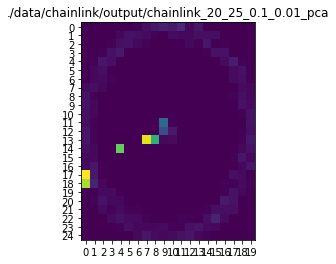

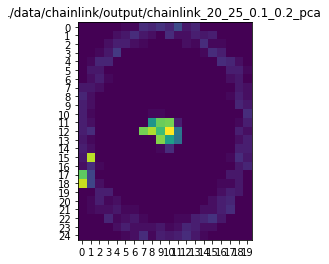

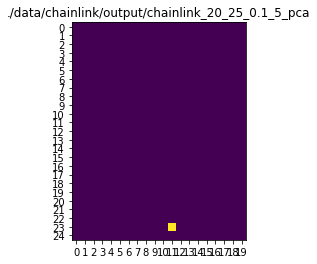

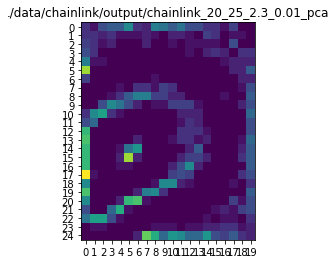

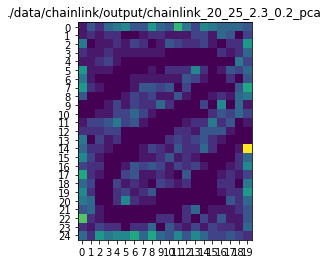

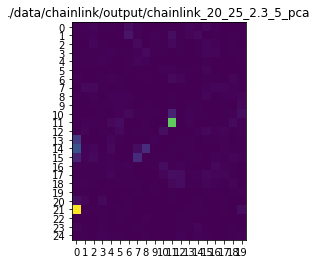

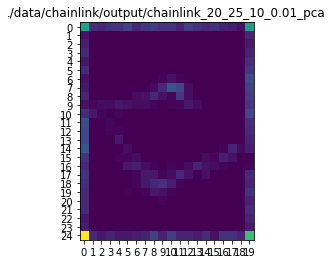

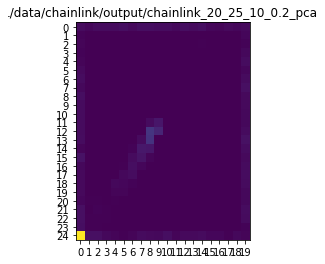

c:\users\redbull129\appdata\local\programs\python\python37\lib\site-packages\numpy\linalg\linalg.py:2506: RuntimeWarning: overflow encountered in multiply
  s = (x.conj() * x).real
c:\users\redbull129\appdata\local\programs\python\python37\lib\site-packages\numpy\linalg\linalg.py:2507: RuntimeWarning: overflow encountered in reduce
  return sqrt(add.reduce(s, axis=axis, keepdims=keepdims))
c:\users\redbull129\appdata\local\programs\python\python37\lib\site-packages\minisom.py:263: RuntimeWarning: invalid value encountered in add
  self._weights += einsum('ij, ijk->ijk', g, x-self._weights)


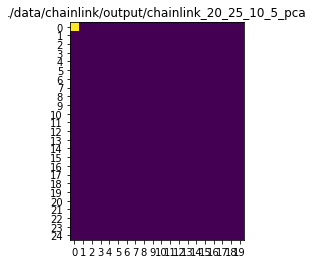

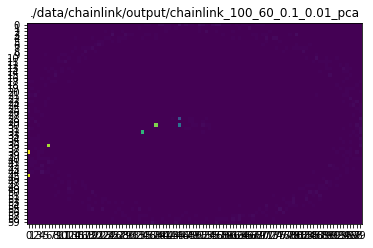

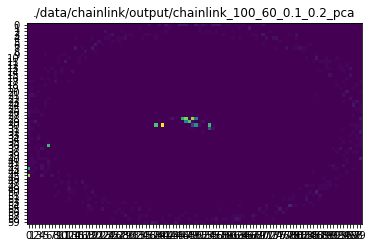

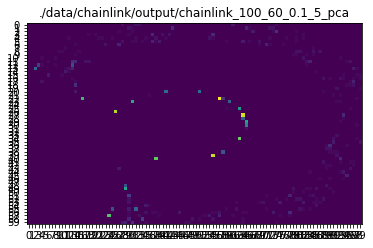

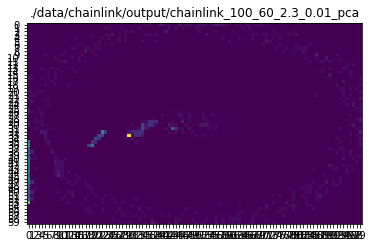

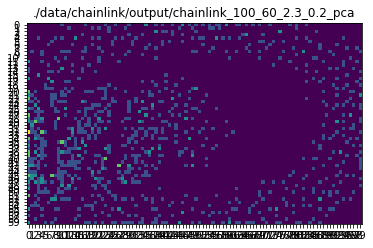

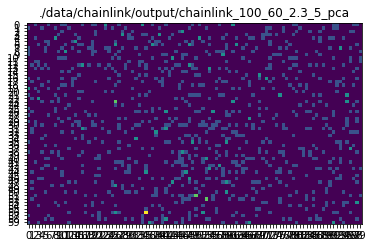

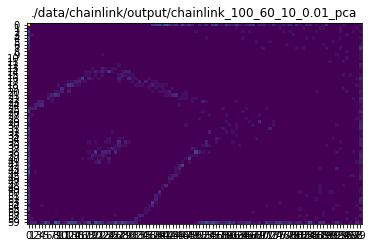

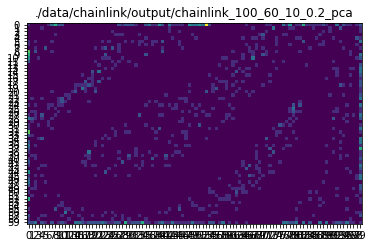

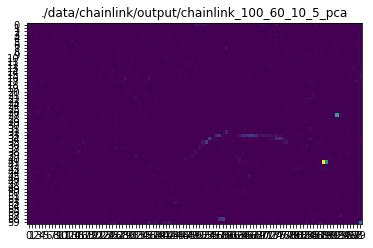

In [20]:
for (x, y) in sizes:
    for sigma in sigmas:
        for learning_rate in learning_rates:
            for pca in [True]:
                _msChainLink.do_som_training(x=x,
                                    y=y,
                                    sigma=sigma,
                                    learning_rate=learning_rate,
                                    iterations=iterations,
                                    pca_initialization=pca,
                                    batch_process=True)
                _msChainLink.get_num_win_map(chainlink_data_out.format(
                                    x,
                                    y,
                                    sigma,
                                    learning_rate,
                                    'pca' if pca else "no-pca")).show()
                _msChainLink.save_files(chainlink_data_out.format(
                                    x,
                                    y,
                                    sigma,
                                    learning_rate,
                                    'pca' if pca else "no-pca"))

dimension: x=20, y=25
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 3.5578321546088434
 topographic error: 0.9411764705882353
dimension: x=20, y=25
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 8.178308000896855
 topographic error: 0.9388235294117647
dimension: x=20, y=25
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 15.849075780067075
 topographic error: 1.0
dimension: x=20, y=25
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 0.21363934838198795
 topographic error: 0.015294117647058824
dimension: x=20, y=25
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 0.12136366333793207
 topographic error: 0.02
dimension: x=20, y=25
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 1.168363125513024
 topographic error: 0.1976470588235294
dimension: x=20, y=25
 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 0.6415083178375451
 topographic error: 0.0
dimension: x=20, y=25
 [ 10000 / 10000 ] 100% - 0:00:00

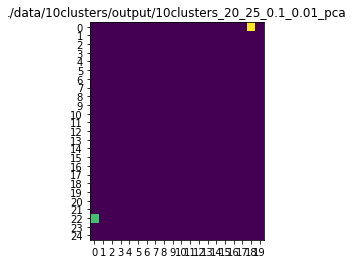

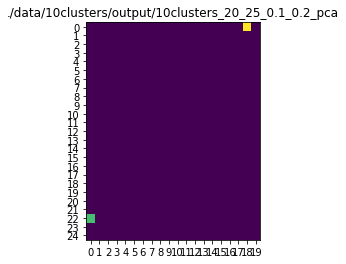

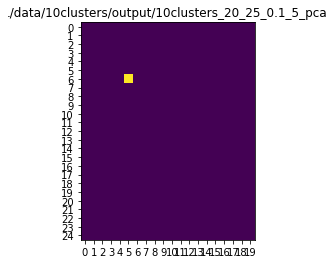

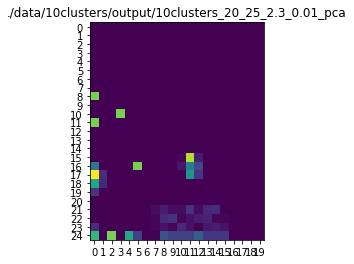

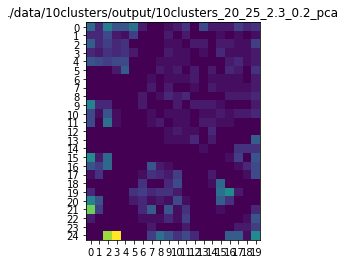

...

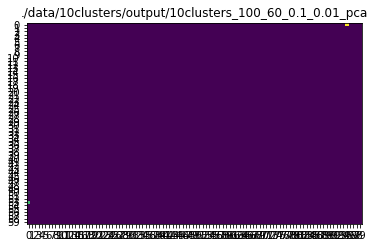

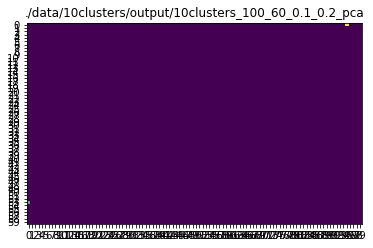

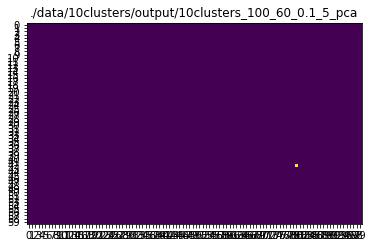

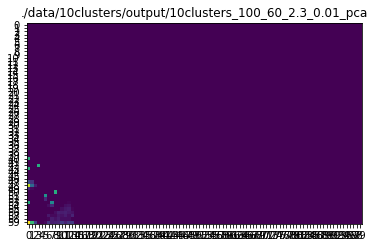

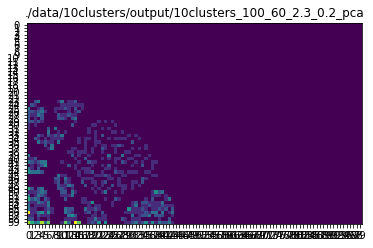

In [ ]:
for (x, y) in sizes:
    for sigma in sigmas:
        for learning_rate in learning_rates:
            for pca in [True]:
                _ms10cluster.do_som_training(x=x,
                                    y=y,
                                    sigma=sigma,
                                    learning_rate=learning_rate,
                                    iterations=iterations,
                                    pca_initialization=pca,
                                    batch_process=True)
                _ms10cluster.get_num_win_map(cluster10_data_out.format(
                                    x,
                                    y,
                                    sigma,
                                    learning_rate,
                                    'pca' if pca else "no-pca")).show()
                _ms10cluster.save_files(cluster10_data_out.format(
                                    x,
                                    y,
                                    sigma,
                                    learning_rate,
                                    'pca' if pca else "no-pca"))